# Lecture 7: Maximum Likelihood Estimation

## Learning Goals

- Identify the graphical and mathematical relationship between two independent continuous random variables.
- Explain the concept of maximum likelihood estimation.
- Apply maximum likelihood estimation for cases with one population parameter.

```{admonition} Note
:class: warning
Let us make a **note on plotting**. You are not expected to create plots like those in these lecture notes. You will check different plotting techniques until **DSCI 531: Data Visualization I**. 
```

In [1]:
options(repr.matrix.max.rows = 20)

library(tidyverse)
library(plotly)
library(cowplot)
library(emdbook)
library(gridExtra)
library(SimDesign)
source("supplementary/ggjointmarg.R")

── Attaching core tidyverse packages ─────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ───────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout



Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp



Attaching package: ‘gridExtra’


The following object is masked from ‘package:d

It is time to delve into a fascinating statistical concept: *estimating distributional parameters in a population or system using sample data*. Today's lecture will focus on **maximum likelihood estimation (MLE)** as a fundamental tool in this process. MLE is closely connected to the probabilistic concepts we have been discussing over the past six lectures in this block. As a result, we will **partially** transition from the realm of probability to the realm of inference. However, we will only cover **parameter estimation** in today's lecture.

## 1. Independence (Revisited)

MLE requires revisiting statistical independence for the last time in this course, but applied to multivariate distributions (i.e., **probability distributions involving more than one random variable**).

### 1.1. Definition of Independence via Probability Distributions

Recall that the independence of random variables $X$ and $Y$ means that knowledge about one variable tells us nothing about the other.

```{admonition} Definition of Independence in Probability Distributions between Two Random Variables
:class: tip
Let $X$ and $Y$ be two **independent** random variables. Using their corresponding marginals, we can obtain their corresponding joint distributions as follows:

- **$X$ and $Y$ are discrete.** Let $P(X = x, Y = y)$ be the joint probability mass function (PMF) with $P(X = x)$ and $P(Y = y)$ as their marginals. Then, we define the joint PMF as:

$$P(X = x, Y = y) = P(X = x) \cdot (Y = y).$$

- **$X$ and $Y$ are continuous.** Let $f_{X,Y}(x,y)$ be the joint probability density function (PDF) with $f_X(x)$ and $f_Y(y)$ as their marginals. Then, we define the joint PDF as:

$$f_{X,Y}(x,y) = f_X(x) \cdot f_Y(y).$$
```

```{important} 
The term denoting a discrete joint PMF $P(X = x, Y = y)$ is **equivalent** to the intersection of events $P(X = x \cap Y = y)$.
```

In the discrete case, this means that a joint probability distribution (when depicted as a table) has each row/column as a multiple of the others because (by definition of independence):

$$P(X = x \cap Y = y) = P(X = x) \cdot P(Y = y).$$

Or, equivalently,

$$P(Y = y \mid X = x) = \frac{P(X = x \cap Y = y)}{P(X = x)} = \frac{P(X = x) \cdot P(Y = y)}{P(X = x)} = P(Y = y).$$

In the continuous case, probabilities become densities. A definition of independence becomes

```{math}
:label: independent-cont-joint
f_{X,Y}(x, y) = f_X(x) \cdot f_Y(y),
```

where $f_{X,Y}(x, y)$ is the joint PDF of the continuous random variables $X$ and $Y$, $f_X(x)$ is the marginal PDF of $X$, and $f_Y(y)$ is the marginal PDF of $Y$. Or, equivalently

```{math}
:label: cond-cont-joint
f_{Y \mid X}(y) = \frac{f_{X,Y}(x, y)}{f_X(x)}= \frac{f_X(x) \cdot f_Y(y)}{f_X(x)} = f_Y(y).
```

````{important}
Each of these two above definitions has an intuitive meaning. The first definition,

```{math}
f_{X,Y}(x, y) = f_X(x) \cdot f_Y(y)
```

in Equation {eq}`independent-cont-joint`, means that, when slicing the joint density at various points along the $x$-axis (and also for the $y$-axis), the resulting one-dimensional function will be the same, except for some multiplication factor. For example,

```{math}
f_{X,Y}(1, y) = f_X(1) \cdot f_Y(y)
```

and

```{math}
f_{X,Y}(2, y) = f_X(2) \cdot f_Y(y).
```

So $f_{X,Y}(1, y)$ and $f_{X,Y}(2,y)$ are actually the same function, just scaled by different factors. Note that $f_{X,Y}(1,y)$ **is NOT a proper PDF**.

The second definition,

```{math}
f_{Y \mid X}(y) = f_Y(y)
```

in Equation {eq}`cond-cont-joint`, is probably more intuitive. As in the discrete case, it means that knowing $X$ does not tell us anything about $Y$. The same could be said about the reverse. To see why definition in Equation {eq}`independent-cont-joint` is equivalent to the definition in in Equation {eq}`cond-cont-joint`, consider the below formula, which holds regardless of whether we have independence (we have seen this formula before):

```{math}
f_{X,Y}(x, y) = f_{Y \mid X}(y) \ f_X(x).
```

Setting $f_{Y \mid X}(\cdot)$ equal to $f_Y(\cdot)$ results in the original definition from Equation {eq}`independent-cont-joint`.
````

(independence-continuous)=
### 1.2. Independence Visualized for Two Continuous Random Variables

Let us start with **theoretical contour plots in multivariate continuous distributions**. When it comes to bivariate probability density functions (PDFs), it is informative to plot the marginal densities on each axis. In general, just by looking at a contour plot of a bivariate density function, it is hard to tell whether this distribution is of two independent random variables. But we **can** tell by looking at "slices" of the distribution. 

Here is an example of two **independent** random variables where 

$$X \sim \text{Exponential}(\lambda = 1),$$ 

and 

$$Y \sim \mathcal{N}\left(\mu = 0, \sigma^2 = 1\right).$$

Mathematically, their joint PDF is expressed as:

```{math}
\begin{align*}
f_{X,Y} \left( x, y \right) &= f_X \left( x \mid \lambda = 1 \right) \times f_Y \left( y \mid \mu = 0, \sigma^2 = 1 \right) \\
&= \left[ \lambda \exp(-\lambda x) \right] \times \left\{ \frac{1}{\sqrt{2\pi \sigma^2}} \exp \left[ -\frac{(y - \mu)^2}{2\sigma^2} \right] \right\} \\
&= \exp(-x) \times \left[ \frac{1}{\sqrt{2\pi}} \exp \left( -\frac{y^2}{2} \right) \right].
\end{align*}
```

Their corresponding joint PDF is shown in the below three-dimensional plot:

In [2]:
options(repr.plot.width = 20, repr.plot.height = 10)

# NOTE: x and y coordinates are inverted in the code with respect to the random variable setup

z_settings <- list(
  title = "Probability <br>Density"
)

x_settings <- list(
  range = c(0, 3)
)

y_settings <- list(
  range = c(-3, 3)
)

plot_ly(z = sapply(
  x <- seq(-3, 3, .1),
  function(y) dnorm(x) * dexp(y)
), x = x, y = x, type = "surface") %>%
  layout(scene = list(
    xaxis = x_settings,
    yaxis = y_settings,
    zaxis = z_settings
  ))

HTML widgets cannot be represented in plain text (need html)

Now, the previous three-dimensional plot also has a contour version, as shown below. We will slice this contour plot along the dashed orange lines:

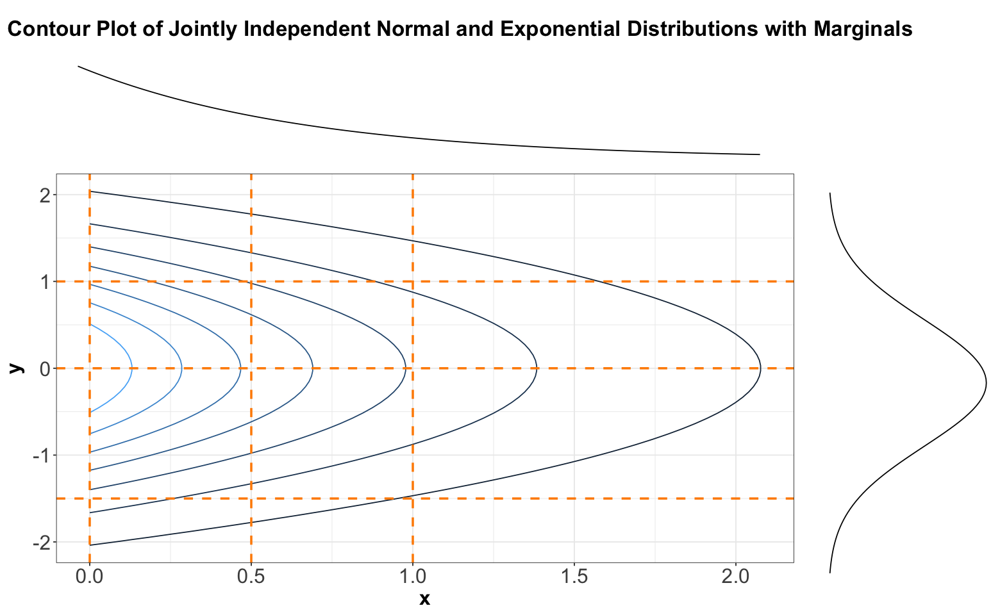

In [3]:
options(repr.plot.width = 13, repr.plot.height = 8)

dindexpn <- function(x, y) dexp(x) * dnorm(y)
slice_loc <- tibble(
  x = c(0, 0.5, 1),
  y = c(-1.5, 0, 1)
)
slices <- list(
  geom_vline(xintercept = slice_loc$x, linetype = "dashed", alpha = 1, colour = "darkorange", linewidth = 1),
  geom_hline(yintercept = slice_loc$y, linetype = "dashed", alpha = 1, colour = "darkorange", linewidth = 1)
)
data_indep <- crossing(
  x = seq(0, 3, length.out = 100),
  y = seq(-3, 3, length.out = 100)
) %>%
  mutate(z = dindexpn(x, y))

title_2 <- ggdraw() + 
  draw_label(
    "Contour Plot of Jointly Independent Normal and Exponential Distributions with Marginals",
    fontface = 'bold',
    x = 0,
    hjust = 0,
    size = 20
  ) +
  theme(
    plot.margin = margin(0, 0, 0, 7)
  )

suppressMessages(suppressWarnings(print(plot_grid(
  title_2, ggjointmarg(data_indep, dexp, dnorm, p21_layers = slices),
  ncol = 1,
  rel_heights = c(0.1, 1)
))))

Below, you can find the slices in each case denoted by the previous dashed orange lines. We can see that these slices resemble the form of Exponential distributions for $x$ and Normal distributions for $y$.

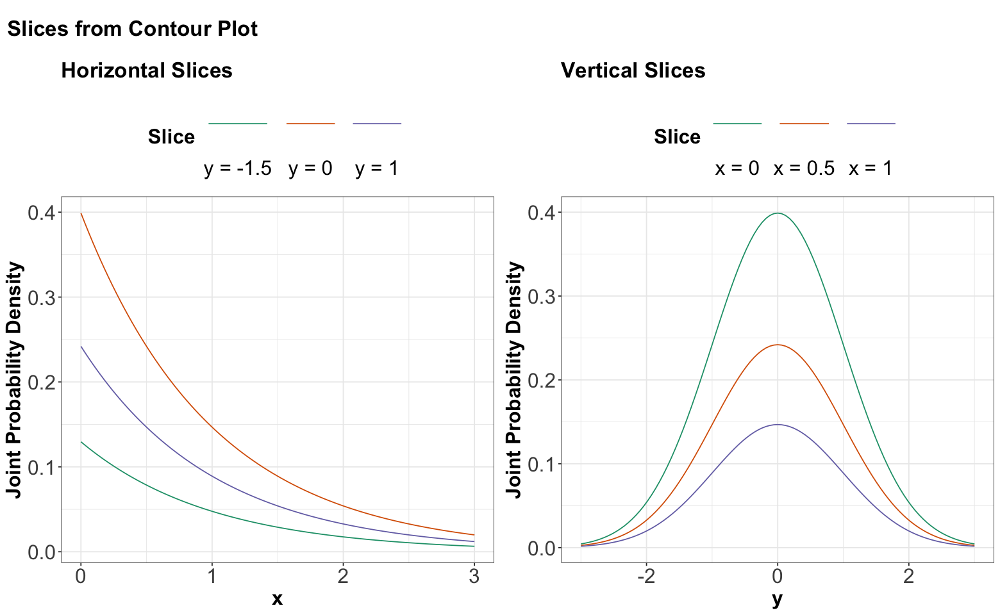

In [4]:
title_3 <- ggdraw() + 
  draw_label(
    "Slices from Contour Plot",
    fontface = 'bold',
    x = 0,
    hjust = 0,
    size = 20
  ) +
  theme(
    plot.margin = margin(0, 0, 0, 7)
  )

exp_and_normal_marginal_plots <- cowplot::plot_grid(
  ggplot(data_indep, aes(x)) +
    map(slice_loc$y, function(y_) {
      stat_function(
        fun = function(x) dindexpn(x, y_),
        mapping = aes(colour = str_c("y = ", y_))
      )
    }) +
    theme_bw() +
    theme(legend.position = "top") +
    ylab("Density") +
    ggtitle("Horizontal Slices") +
  theme(
      plot.title = element_text(size = 20, face = "bold"),
	  axis.text = element_text(size = 19),
	  axis.title = element_text(size = 19, face = "bold"),
	  legend.title=element_text(size = 19, face = "bold"), 
	  legend.text=element_text(size = 19),
      legend.key.size = unit(2, 'cm'),
      legend.spacing.y = unit(0.0002, 'cm')) +
  labs(x = "x", y = "Joint Probability Density") +
  scale_colour_brewer(name = "Slice", palette = "Dark2",
                      guide= guide_legend(label.position = "bottom")),
  ggplot(data_indep, aes(y)) +
    map(slice_loc$x, function(x_) {
      stat_function(
        fun     = function(y) dindexpn(x_, y),
        mapping = aes(colour = str_c("x = ", x_))
      )
    }) +
    theme_bw() +
    theme(legend.position = "top") +
    ylab("Density") +
    ggtitle("Vertical Slices") +
  theme(
      plot.title = element_text(size = 20, face = "bold"),
	  axis.text = element_text(size = 19),
	  axis.title = element_text(size = 19, face = "bold"),
	  legend.title=element_text(size = 19, face = "bold"), 
	  legend.text=element_text(size = 19),
      legend.key.size = unit(2, 'cm'),
      legend.spacing.y = unit(0.0002, 'cm')) +
  labs(x = "y", y = "Joint Probability Density") +
  scale_colour_brewer(name = "Slice", palette = "Dark2",
                      guide= guide_legend(label.position = "bottom")) 
)

plot_grid(
  title_3, exp_and_normal_marginal_plots,
  ncol = 1,
  rel_heights = c(0.1, 1))

Again, looking above, it is not that each vertical (or horizontal) slice is **the same**, but they are all the same **when the slice is normalized**. In other words, every slice has **the same shape**. 

What do we get when we normalize these slices so that the curves have an area of 1 underneath? By definition, we get the conditional distributions **given the slice value**. And, these conditional distributions will be the exact same (one for each axis $x$ and $y$) since the sliced densities only differ by a multiple anyway. What is more, this common distribution is just the marginal.

Mathematically, what we are saying is $$f_{Y \mid X}(y) = \frac{f_{X,Y}(x,y)}{f_X(x)} = \frac{f_{X}(x) \cdot f_{Y}(y)}{f_X(x)} = f_Y(y).$$

And we have the same for $X \mid Y$. Again, we are back to the definition of independence!

Now, here is an example where we have **two independent Standard Normal distributions** $X$ and $Y$ whose marginals are the following:

```{math}
\begin{gather*}
X \sim \mathcal{N}(\mu_X = 0, \sigma^2_X = 1) \\
Y \sim \mathcal{N}(\mu_Y = 0, \sigma^2_Y = 1).
\end{gather*}
```

```{important} 
**In general**, not just in the case of joint distributions, we say that a Normal random variable is Standard Normal when its mean equals $0$ and its variance equals 1.
```

Their joint PDF is:

```{math}
\begin{align*}
f_{X,Y} \left( x, y \right) &= f_X \left( x \mid \mu_X = 1, \sigma_X^2 = 1 \right) \times f_Y \left( y \mid \mu_Y = 0, \sigma_Y^2 = 1 \right) \\
&= \left\{ \frac{1}{\sqrt{2\pi \sigma_X^2}} \exp \left[ -\frac{(x - \mu_X)^2}{2\sigma_X^2} \right] \right\} \times \left\{ \frac{1}{\sqrt{2\pi \sigma_Y^2}} \exp \left[ -\frac{(y - \mu_Y)^2}{2\sigma_Y^2} \right] \right\} \\
&= \left[ \frac{1}{\sqrt{2\pi}} \exp \left( -\frac{x^2}{2} \right) \right] \times \left[ \frac{1}{\sqrt{2\pi}} \exp \left( -\frac{y^2}{2} \right) \right].
\end{align*}
```

The above joint distribution is also called a **bivariate Normal or Gaussian**.

In [5]:
x <- seq(-3, 3, length.out = 100)
y <- seq(-3, 3, length.out = 100)
cov_mat <- matrix(c(1, 0, 0, 1), nrow = 2)

mult_data <- expand.grid(x = x, y = y) %>%
  mutate(z = rep(0, 10000))

mu <- c(0, 0)

for (i in 1:nrow(mult_data)) {
  mult_data$z[i] <-dmvnorm(c(mult_data$x[i], mult_data$y[i]),
    mu = mu, Sigma = cov_mat
  )
}

In [6]:
options(repr.plot.height = 10)

title_3 <- ggdraw() + 
  draw_label(
    "Contour Plot of an Independent Bivariate Standard Normal Distribution with Marginals",
    fontface = 'bold',
    x = 0,
    hjust = 0,
    size = 20
  ) +
  theme(
    plot.margin = margin(0, 0, 0, 7)
  )

```{important}
Below, we can see the contour plot of this bivariate Normal distribution composed of two independent Standard Normal distributions $X$ and $Y$. Note the contours are **perfectly centred in the middle**, which graphically implies **independence**. 

If $X$ and $Y$ were not independent, then **these contours would appear in a diagonal pattern**.
```

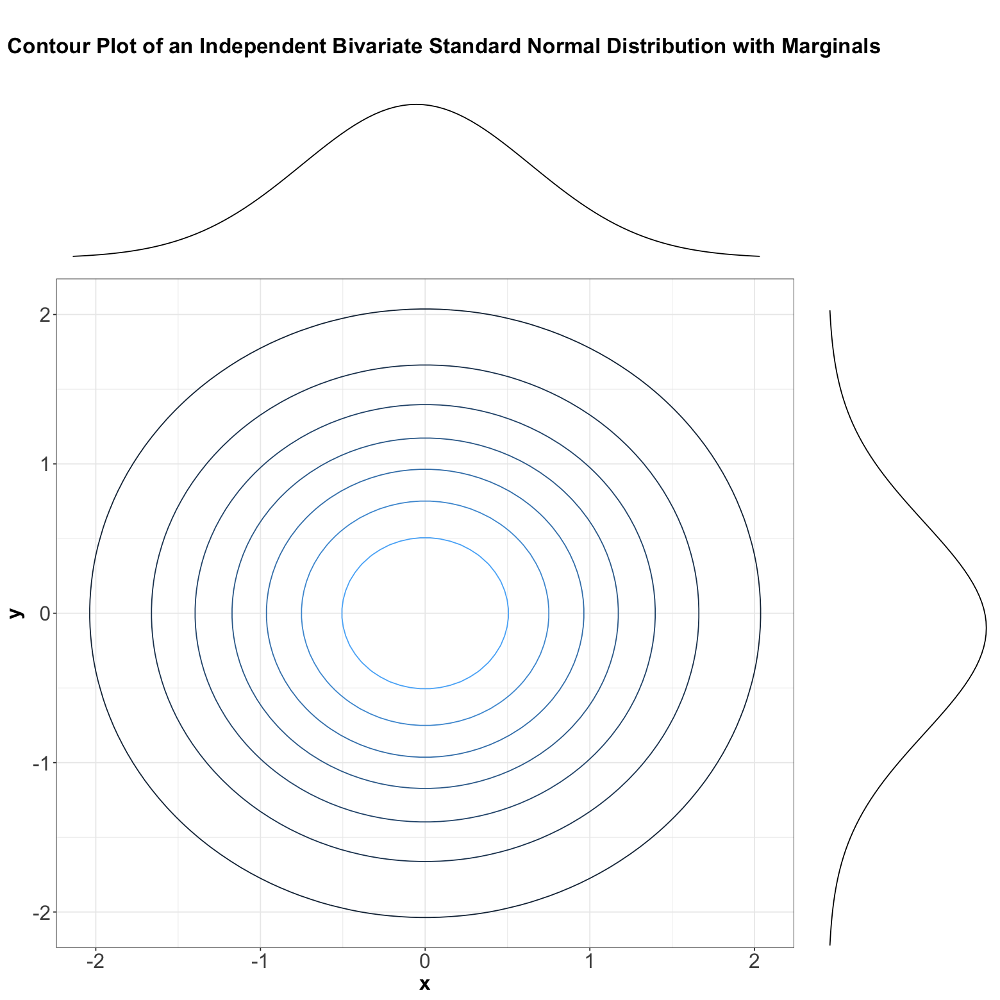

In [7]:
options(repr.plot.width = 13, repr.plot.height = 13)

suppressMessages(suppressWarnings(print(plot_grid(
  title_3, ggjointmarg(mult_data, dnorm, dnorm),
  ncol = 1,
  rel_heights = c(0.1, 1)
))))

Its corresponding three-dimensional plot is shown below:

In [8]:
z_settings <- list(
  title = "Probability <br>Density"
)

plot_ly(z = sapply(
  x <- seq(-3, 3, .1),
  function(y) (1 / (2 * pi)) * 
    exp(-(y^2 / 2) - ((x)^2 / (2 * (1))))
), x = x, y = x, type = "surface") %>%
  layout(scene = list(
    zaxis = z_settings
  ))

HTML widgets cannot be represented in plain text (need html)

In [9]:
set.seed(551)

x <- seq(-3, 3, length.out = 100)
y <- seq(-3, 3, length.out = 100)
corr <- c(-0.9, -0.5, 0, 0.5, 0.9)

mult_data_corr <- expand.grid(x = x, y = y, corr = corr) %>%
  mutate(z = rep(0, 50000))

mu <- c(0, 0)


for (i in 1:nrow(mult_data_corr)) {
  mult_data_corr$z[i] <- dmvnorm(c(mult_data_corr$x[i], mult_data_corr$y[i]),
    mu = mu, Sigma = matrix(c(1, mult_data_corr$corr[i], mult_data_corr$corr[i], 1), nrow = 2)
  )
}

mult_data_corr <- mult_data_corr %>%
  	mutate(mean = corr * x,
           upper = mean + sqrt(1 - corr^2)*qnorm(0.05),
           lower = mean - sqrt(1 - corr^2)*qnorm(0.05))

```{important} 
We might wonder what we meant by contours that are **perfectly centred in the middle** in the above bivariate Normal case composed of two **independent** Standard Normal distributions, so let us explore the five panels below.

An essential component of a Bivariate Normal distribution is the Pearson's correlation coefficient which measures linear dependency between $X$ and $Y$, such as the one we saw in a previous lecture; you can check Equation {eq}`pearson-coefficient`. For our marginal Standard Normal random variables $X$ and $Y$, let us define their Pearson's correlation coefficient as $\rho_{XY}$. Overall, the five panels below indicate the following:

- When $X$ and $Y$ are independent, by definition of independence, their $\rho_{XY} = 0$ (as in the below panel in the middle). Therefore, their contours are **perfectly centred in the middle**. This corresponds to the big contour plot we saw previously!
- On the other hand, when $X$ and $Y$ are not independent, their $\rho_{XY} \neq 0$ (as in the other four panels below). Note their contours have a diagonal pattern!
```

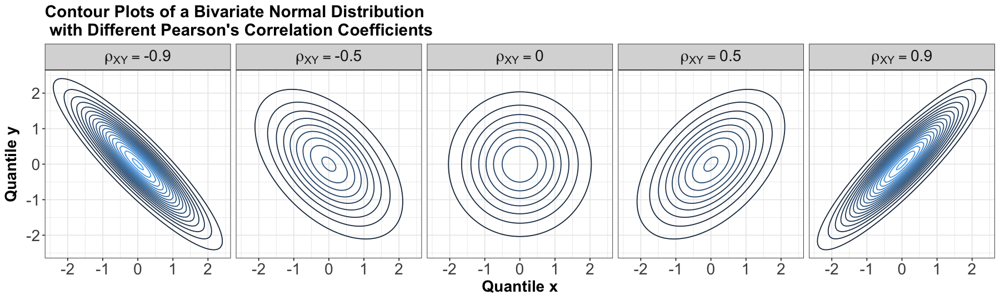

In [10]:
options(repr.plot.height = 4.5, repr.plot.width = 15)

mult_data_plots <- mult_data_corr %>%
  bind_rows() %>% 
	ggplot(aes(x, y)) +
	facet_grid(cols = vars(corr), 
                    labeller = label_bquote(cols = rho[XY]==.(corr))) +
	theme_bw() +
	geom_contour(aes(z = z, colour = after_stat(level)), bins = 20) +
	scale_color_continuous(guide = "none") +
  theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.text = element_text(size = 17),
    axis.title = element_text(size = 17, face = "bold"),
    strip.text = element_text(size = 17)
  ) +
  ggtitle("Contour Plots of a Bivariate Normal Distribution \n with Different Pearson's Correlation Coefficients") +
  labs(
    x = "Quantile x",
    y = "Quantile y"
  )
mult_data_plots

```{admonition} Note
:class: warning

If you want to know more about the parametrization of a bivariate Normal distribution, you can check [**this section in the Distribution Appendix**](bivariate-normal). Note this in-depth mathematical definition is out of the scope of this course.
```

Now, let us move on to another statistical concept on which classical MLE relies heavily: a **random sample**. Note that this concept carries forward the notion of independence in random variables.

## 2. Random Samples

Let us start with the formal definition of a random sample.

```{admonition} Definition of Random Sample
:class: tip
A **random sample** is a collection of random outcomes/variables. Using mathematical notation, a random sample of size $n$ is usually depicted with random variables $X_1, \ldots, X_n$. We think of data as being a random sample. 
```

**Unless we make additional sampling assumptions**, a **default** random sample is said to be **independent and identically distributed** (or **iid**) if:

1. Each pair of observations are **independent**, and
2. each observation comes from **the same distribution**.

```{important} 
**Why is sampling important in statistical practice?** Well, populations or systems of interest are governed by fixed parameters (**under a frequentist paradigm**) since we assume that the data from these populations or systems of interest can be modelled via diverse discrete and/or continuous distributions. These parameters are considered to be **the true ones**. Within these parameters, you could encounter measures of central tendency, e.g., the mean $\mu$ of the Normal distribution or the mean $\beta$ of the Exponential distribution. Also, one could encounter measures of uncertainty such as the variance $\sigma^2$ of the Normal distribution.

We will never know these true parameters in practice, but we aim to estimate them via sampled data collected from these populations or systems of interest. Using our **observed sampled data**, we can perform the corresponding parameter estimation via MLE (for instance!) and then proceed to statistical inference (i.e., the topics from **DSCI 552: Statistical Inference and Computation I**).
```

## 3. Estimating true parameters!

As previously discussed, we can use MLE to estimate the true parameters from a given population or system of interest. This method heavily relies on **a random sample of $n$ observations** from the **population or system of interest**. There could be cases with only one parameter; therefore, we will apply **univariate MLE**. On the other hand, we might encounter cases involving more than one parameter to estimate; this is called **multivariate MLE**.

**MLE provides you with a great way to find estimators**, which are usually well-behaved (asymptotically speaking, i.e., when we collect a large enough number of data points $n$). Finding good estimators is a difficult task. For example, the sample mean

```{math}
:label: sample-mean-mle
\bar{Y} = \sum_{i = 1}^n \frac{Y_i}{n}
```

is a trivial case with a very intuitive answer. Still, as we will see in today's MLE, **this intuitive answer is backed up with interesting statistical modelling assumptions**.

On the other hand, **in practical contexts involving more than one variable**, you are trying to estimate something much more complex. For example $\beta_0$ and $\beta_1$ from a linear regression model: 

$$Y = \beta_0 + \beta_1 X_1 + \varepsilon.$$ 

**How would you estimate these parameters when $\varepsilon \sim \mathcal{N}(0, \sigma^2)$?** MLE can help with that! It is an alternative to least squares estimation (to be seen in **DSCI 561: Regression I**). In more complex regression frameworks, such as generalized linear models (GLMs) to be covered in **DSCI 562: Regression II**, MLE is the go-to parameter estimation method.

```{important} 
Since the scope of this lecture is mostly about the conceptual understanding of the MLE process regarding distributional parameters, we will narrow down the attention to univariate cases. This also extends to `lab4` and `quiz2`. That said, in day-to-day statistical practice, this conceptual understanding can also be extended to multivariate cases for more complex data modelling.
```

### 3.1. A first example!

Suppose we have an **empirical distribution** of standard deviations of gene expression for different genes. This empirical distribution corresponds to **a random sample of standard deviations**. Moreover, we would like to **estimate** the **parameters** from the **population** this sample is coming from!

``` {figure} img/mle_motivation.png
:height: 800px
:name: sample-sd
Image from *Data Analysis for the Life Sciences* (Irizarry and Love, 2016).
```

### 3.2. How can we do this?

{numref}`sample-sd` gives us some ideas. First, note that the same histogram corresponding to the **observed random sample** appears in each grid cell. Second, **each orange line represents** a given **theoretical probability density function (PDF) under specific population parameters**.

Now, we might wonder: **what orange line fits the histogram better?** Or in other words, **what orange line makes the observed sample THE MOST LIKELY?** 

> The question above is the intuition of MLE!


## 4. What is the definition of MLE?

MLE is a method that, **given some observed data and some assumed family of probability distributions**, seeks to find values of the parameters that would make the observed data **most likely to have occurred**.

**Alternatively:** MLE is a method that, given some observed data and some assumed family of probability distributions, seeks to find the distribution that would make the observed data most likely to have occurred. The **distributional parameters** specify this distribution.

These are the **EMPIRICAL** steps we follow for our previous example using MLE:

1. Firstly, we choose a family of theoretical distributions that **we assume our observed sample data comes from**. Here, we chose an [$F$-distribution](https://www.math.wm.edu/~leemis/chart/UDR/PDFs/F.pdf).

> **Heads-up:** How we choose the family of distributions for our statistical modelling will be covered in more detail in **DSCI 562**.

2. Next, we vary the parameter(s) for that **parametric family of theoretical distributions** to find a specific, single distribution that best fits the observed data. This resembles a **trial and error** approach. 

In our previous example, from the histograms, can we do it just by eyeballing it? Not precisely!

So how can we do this? MLE is one way and it involves, as the name says, **finding a maximum likelihood**. Let us now explore how this is achieved.

### 4.1. Some key ideas...

Let us explore some further key ideas on the process behind MLE:

- One crucial element to consider is the nature of our variable of interest (**is it continuous or discrete?**).
- Then, we aim to **estimate** the **parameters** of a theoretical **distribution** (e.g., $\lambda$ in a Poisson distribution, or $\mu$ and $\sigma^2$ in the case of a Normal distribution). 
- Therefore, we need to make a distributional assumption for our data -- at the family level, i.e., **choose a distribution**: Normal, Exponential, Poisson, Binomial, etc.
- Afterwards, we play around with the parameters for that family of distributions to find the one that would be **most likely** given our data and choose the corresponding parametric **estimates**.
- To obtain these estimates, we use the **likelihood function** of our **observed random sample**. This involves **maximizing** this likelihood function (which is an **optimization matter**!).

### 4.2. But, what is the likelihood function?

```{important} 
Before we dive into the maximum likelihood estimation (MLE) case for this lecture, we must emphasize that the following elaboration is not just theoretical and abstract. **It is important to provide practical examples when learning this crucial statistical topic to develop a strong understanding of it in the context of our everyday Data Science work.** This understanding will be especially useful when dealing with more complex data modelling. However, **the core principles of MLE still apply in these more intricate models**.
```

Let us take a look at {numref}`ice-cream`.


``` {figure} img/ice-cream.jpg
:height: 500px
:name: ice-cream
Ice cream!
```

**Great!** Now that we have the first case impression, let us elaborate on our MLE inquiry about ice cream.

Imagine you are the owner of a large fleet of ice cream carts, around 900 to be exact. These ice cream carts operate across different parks in the following Canadian cities: *Vancouver*, *Victoria*, *Edmonton*, *Calgary*, *Winnipeg*, *Ottawa*, *Toronto*, and *Montréal*. Furthermore, suppose you have a well-defined overall **population** of interest for those above eight Canadian cities: **all our potential ice cream customers during any given Summer day**.

For the sake of our MLE case, we will call the corresponding statistical query a **time query**. As a critical component of demand planning, the *Operations staff* currently requires a realistic estimation of **the average wait time from one customer to the next one in any given cart during Summer days in these eight Canadian cities**. 

```{important}
There is a crucial characteristic on our **time query** that we will always have to keep in mind: 

> *This average wait time would allow the operations team to plan carefully how much stock each cart should have so there will not be any waste or shortage*.
```

Summertime represents the most profitable season from a business perspective, thus, solving the **time query** is a significant priority for your company. Hence, you decided to organize a meeting with your eight general managers (one per Canadian city) by last mid-summer. Finally, during the meeting with the general managers, it was first (**and wrongly!**) discussed to do the following:

> *Since the operations team has not previously recorded any historical data, **ALL** vendor staff from 900 carts will start collecting data on **the wait time in minutes** between each customer this upcoming Summer days of 2025.*

Nonetheless, when agreeing on the specific operations protocol to start recording wait times for all the 900 vending carts this upcoming Summer of 2025, *Ottawa's general manager* provides a comment for further statistical food for thought:

> *The operations protocol for recording wait times in the 900 vending carts looks too cumbersome to implement straightforwardly this upcoming Summer. Why don't we select **A SMALLER GROUP** of ice cream carts across the eight cities to have a more efficient process implementation that would allow us to optimize operational costs?*

Bingo! *Ottawa's general manager* just nailed the probabilistic way of estimating our population parameter interest for our **time query**. Indeed, their comment was primarily framed from a business perspective of optimizing operational costs. Still, this fact does not take away a crucial insight on which statistical estimation is built: **a random sample**.

Furthermore, in this example and many others, let us emphasize that **probability** can be viewed as the language to decode random phenomena that occur in **any given population or system of interest**. Regarding our specific **time query**, a phenomenon of this kind can be represented by **any randomly recorded wait time between two customers during a Summer weekend in any of the ice cream carts of the above eight Canadian cities**.

```{important} 
Having said all this, **supposing there was a concrete final action plan from the above meeting with the general managers**, let us clarify what three facts were agreed as crucial for the corresponding estimation process to be used in the **time query**:

- **Population of interest:** All our potential ice cream customers during any given Summer day in the following Canadian cities: *Vancouver*, *Victoria*, *Edmonton*, *Calgary*, *Winnipeg*, *Ottawa*, *Toronto*, and *Montréal*.
- **Parameter of interest:** **Mean** wait time **in minutes** between each customer during a given Summer (**continuous and non-negative**).
- **How to estimate the parameter of interest:** Let us use MLE via **an observed random sample** of $n$ wait times across a representative small subset of the ice cream carts of the above eight Canadian cities during a given Summer. The company plans to run the sample data collection this upcoming Summer of 2025.
```

```{admonition} Note
:class: warning
**How we sample our data for parameter estimation depends heavily on the structure of our population or system of interest.** That said, the simplest way to sample is called **simple random sampling** in which any element of this population or system has the same probability of being sampled.

That said, statistical practice has more than one sampling scheme (**besides simple random sampling**). This sampling scheme is another key factor in our parameter estimation (either classical univariate MLE, as in this ice cream example, or a more complex statistical model that could also involve multivariate MLE). Sampling techniques are out of the scope of this lecture, course, and MDS in general. If you want to get deeper information on sampling techniques, [Lohr (2021)](https://www.taylorfrancis.com/books/mono/10.1201/9780429298899/sampling-sharon-lohr) is a must-read for different sampling techniques. 
```

Since the Summer of 2025 is still far away, you decided to run a really small pilot study across the eight Canadian cities by the end of the past Summer (to define a robust sampling protocol). You implemented a quick simple random sampling from these eight Canadian cities overall and got **a sample of size $n = 30$ wait times in minutes** (taken from a really small set of ice cream carts).

Let us use this sample data to show how MLE works for our already defined **parameter of interest**. It is stored in `sample_n30`.

In [11]:
sample_n30 <- tibble(values = c(
  24.9458614574341, 7.23174970992907, 4.16136401519179, 5.60304128237143,
  5.37929488345981, 1.40547217217847, 7.0701988485075, 2.84055356831115,
  0.894746121019125, 2.9016381111011, 3.19011222943664, 11.0930137682099,
  3.49700326472521, 46.2914818498428, 2.00653892990149, 2.87363994969391,
  11.4050390862658, 11.6616687767937, 12.8855835341646, 3.88483320176601,
  0.406148910522461, 25.7642258988289, 8.4743227359272, 4.17410666868091,
  1.84968510270119, 2.15972620035141, 10.5289600339151, 6.44162824716339,
  10.6035323139645, 66.6861112673485
))

Firstly, let us plot **the empirical (sample) distribution** as a **histogram** (we have continuous data) but using **a density scale** as a first step:

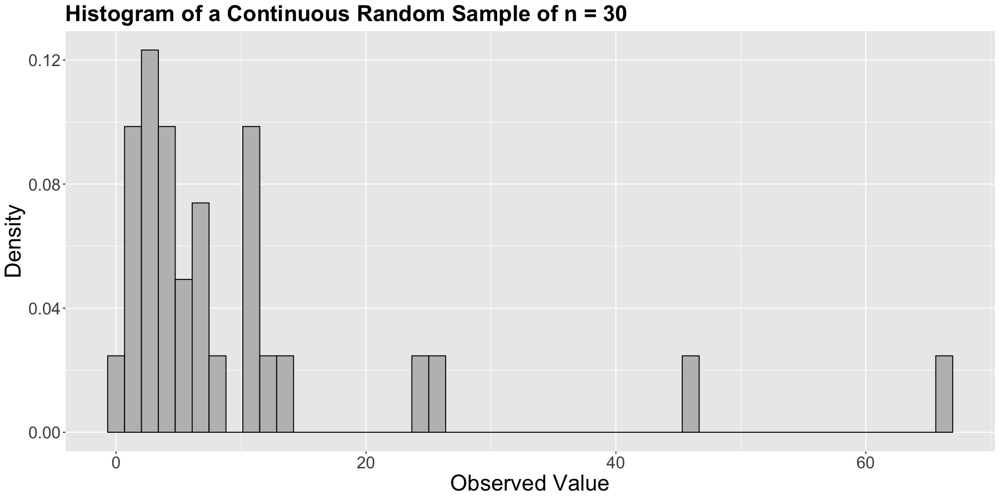

In [14]:
options(repr.plot.height = 7.5, repr.plot.width = 15)

hist_sample_n30 <- sample_n30 %>%
    ggplot() +
    geom_histogram(aes(values, ..density..), fill = "grey", color = "black", bins = 50) +
    theme(
      plot.title = element_text(size = 24, face = "bold"),
      axis.text = element_text(size = 18),
      axis.title = element_text(size = 24)
    ) +
    ggtitle("Histogram of a Continuous Random Sample of n = 30") +
    scale_colour_discrete(name = expression(paste("Mean (", beta, ")"))) +
    labs(x = "Observed Value", y = "Density")

hist_sample_n30

It is time to exercise our learning from {doc}`06_lecture-continuous-families`, and choose **an appropriate distribution** to model our wait times. The **Exponential distribution** is a suitable one! As we previously discussed, **it is a continuous and non-negative distribution** that allows us to model **wait times**. Therefore, let us go ahead with this distribution. But beforehand, let us check an [**iClicker**](https://www.iclicker.com/) question.

```{exercise}
:label: lecture7-q1

**Besides the Exponential distribution**, what other suitable distribution can we used?

Select the correct option:

**A.** Poisson

**B.** Log-Normal

**C.** Binomial

**D.** Weibull
```

It is important to emphasize that the [**Exponential distribution**](#exponential-distribution) has two parametrizations: one for the **mean wait time** $\beta > 0$ and another one for the **average rate** $\lambda > 0$ at which events happen (e.g., ice creams sold per hour). In the context of our **time query**, the population **mean wait time** $\beta > 0$ parametrization is the most suitable one. Therefore, we need to estimate $\beta$.

Therefore, let us start with some mathematical notation. Suppose we have a **random sample** of size $n = 30$ of the following *independent and identically distributed (iid)* **random variables** (which are non-negative and continuous **wait times**):

$$Y_1, Y_2, Y_3, \dots, Y_{28}, Y_{29}, Y_{30}$$

Moreover, given our distributional assumption, each random variable is modelled as:



$$Y_i \sim \text{Exponential}(\beta) \quad \text{for } i = 1, 2, \dots 30.$$

```{exercise}
:label: lecture7-q2

Answer **TRUE** or **FALSE**:

Assuming complete independence between the random variables of our sample of size $n = 30$ across the eight Canadian cities is an entirely realistic assumption.

**A.** TRUE

**B.** FALSE
```

Moving along with our data analysis, each observation is $y_i$ ($i = 1, \dots, 30$) such as the values in `sample_n30`) with the following PDF:

```{math}
:label: standalone-exponential
f_{Y_i}(y_i \mid \beta) = \frac{1}{\beta} \exp(-y_i / \beta).
```

```{important}
Note that the standalone PDF {eq}`standalone-exponential` for the random variable $Y_i$ shows a lowercase $y_i$. This lowercase is not arbitrary; it refers to the **observed value** $y_i$ in our random sample.
```

**How can we estimate the population's mean wait time $\beta$ in minutes?** MLE is one possible approach to overcome this matter:

- First, we choose a theoretical distribution that we believe our sample's empirical distribution is coming. The Equation {eq}`standalone-exponential`, $f_{Y_i}(y_i \mid \beta)$, will be extremely useful. Here, we chose a distribution such as the Exponential given our right-skewed `hist_sample_n30` (the empirical distribution) and the nature of our observed sample (non-negative and continuous).
- In our random sample, we assume all the $n$ observations are *iid*. This assumption leads to the following **joint PDF**:

$$
f_{Y_1, \dots, Y_n}(y_1, \dots, y_n \mid \beta) = \prod_{i = 1}^n \frac{1}{\beta} \exp(-y_i / \beta).
$$

Note the joint PDF of our random sample has a form similar to the joint bivariate PDFs we saw in our [**previous section on independence visualization**](#independence-continuous), i.e., all the $n$ standalone PDFs are multiplying each other since the corresponding random variables $Y_1, Y_2, Y_3, \dots, Y_{28}, Y_{29}, Y_{30}$ are assumed as *independent*. Moreover, given that they are assumed as identically distributed, we use the same standalone PDF but $n$ times.

Now, you might wonder: **where is the likelihood function?** The likelihood function is a function of the parameters of a given/chosen theoretical distribution.

```{important}
A likelihood function is equivalent (**mathematically!**) to the joint PDF of the random sample (or joint probability mass function, PMF, if the random variables are discrete, as we will see in `lab4`). 

**However, we must change our perspective: we do not know the population parameter, but the sample's observed values**.
```

From our previous example with the joint PDF $f_{Y_1, \dots, Y_n}(y_1, \dots, y_n \mid \beta)$, this implies:

```{math}
:label: exponential-likelihood
L(\beta \mid y_1, \dots, y_n) = f_{Y_1, \dots, Y_n}(y_1, \dots, y_n \mid \beta) = \prod_{i = 1}^n \frac{1}{\beta} \exp(-y_i / \beta).
```

Equation {eq}`exponential-likelihood` is quite particular on its left-hand side; the expression $L(\beta \mid y_1, \dots, y_n)$ indicates the following: 

> *The likelihood of encountering our population mean wait time $\beta$ **GIVEN** our observed sampled values $y_1, \dots, y_n$*.

But still, **mathematically speaking**, this likelihood $L(\beta \mid y_1, \dots, y_n)$ is equivalent to the joint PMF $f_{Y_1, \dots, Y_n}(y_1, \dots, y_n \mid \beta)$.

### 4.3. How do we compute the likelihood?

**Let us start with a smaller and different sample of $n = 3$:**

Suppose we only have three **observations** of wait times in minutes (note the lowercases!): $y_1 = 0.8$, $y_2 = 2.1$, and $y_3 = 2.4$. Moreover, we will assume they come from **the family of Exponential distributions**. The likelihood function would be the joint PDF of this sample:

$$L(\beta \mid y_1, y_2, y_3) = \frac{1}{\beta} \exp(-y_1 / \beta) \times \frac{1}{\beta} \exp(-y_2 / \beta) \times \frac{1}{\beta} \exp(-y_3 / \beta)$$

$$L(\beta \mid y_1, y_2, y_3) = \frac{1}{\beta} \exp(-0.8 / \beta) \times \frac{1}{\beta} \exp(-2.1 / \beta) \times \frac{1}{\beta} \exp(-2.4 / \beta)$$

Look at the left-hand side of the likelihood equation! **The likelihood function is NOT a joint PDF**, even though it mathematically looks the same as the joint PDF of your sample. **The likelihood function is a function of the parameter $\beta$ and not $y_1$, $y_2$, and $y_3$.**


**Calculating the likelihood value:**

Since we want to calculate the likelihood of a specific theoretical distribution given the data we have observed:

$$L(\text{distributional parameter}\, | \,\text{observed data});$$

to calculate the likelihood for a specific distribution for that family, we choose a specific value for $\beta$. Then, we calculate the likelihood. For instance, what is the likelihood of an Exponential distribution where the **population mean wait time $\beta = 0.5$ minutes** given the data we observed?

$$L(\beta \mid y_1, y_2, y_3) = \frac{1}{0.5} \exp(-0.8 / 0.5) \times \frac{1}{0.5} \exp(-2.1 / 0.5) \times \frac{1}{0.5} \exp(-2.4 / 0.5)$$

Let us use `R`!

In [15]:
((1 / 0.5) * exp(-0.8 / 0.5)) * ((1 / 0.5) * exp(-2.1 / 0.5)) * ((1 / 0.5) * exp(-2.4 / 0.5))

[1] 0.0001993281

Or more easily (via `dexp()`):

In [16]:
data <- c(0.8, 2.1, 2.4)
prod(dexp(data, rate = 1 / 0.5)) # dexp() is parametrized as rate = 1 / beta = 1 / 0.5

[1] 0.0001993281

We can use another two $\beta$ values to compute the corresponding likelihood given the data we observed. Let us use $\beta = 2$ and $20$ minutes.

In [17]:
prod(dexp(data, rate = 1 / 2)) # beta = 2

[1] 0.008831402

In [18]:
prod(dexp(data, rate = 1 / 20)) # beta = 20

[1] 9.590074e-05

**Removing the curtain!**

The observed data for this small case ($y_1 = 0.8$, $y_2 = 2.1$, and $y_3 = 2.4$) was actually drawn from an Exponential distribution with $\beta = 2$. Thus, it is not a surprise that the likelihood is higher for this value of $\beta$ than the other two we tried.

### 4.4. Going back to our `sample_n30` 

We will choose a few different Exponential distributions (by varying $\beta$), calculate the likelihood for those distributions given the data we observed, and then overlay those distributions on the empirical distributions (i.e., histograms) to see how they map together.

Let us try the following $\beta$ values: $20$, $8$ and $2$ minutes.

In [19]:
sample_n30

values
<dbl>
24.9458615
7.2317497
4.1613640
5.6030413
5.3792949
1.4054722
7.0701988
2.8405536
0.8947461


We will calculate the **theoretical joint PDF** (`density` in our code) of an Exponential distribution with $\beta = 20$ minutes for a **sequence of quantiles** (`x`) from `0` to `70` by `0.05`:

In [20]:
likelihood_20 <- prod(dexp(sample_n30$values, rate = 1 / 20))
likelihood_20

[1] 1.880207e-46

In [21]:
density_20 <- tibble(
  x = seq(0, 70, 0.05),
  density = dexp(x, rate = 1 / 20)
)
density_20

x,density
<dbl>,<dbl>
0.00,0.05000000
0.05,0.04987516
0.10,0.04975062
0.15,0.04962640
0.20,0.04950249
0.25,0.04937889
0.30,0.04925560
0.35,0.04913261
0.40,0.04900993


Then, we plot this theoretical density on top of **the empirical (sample) distribution** (i.e., the **histogram**).

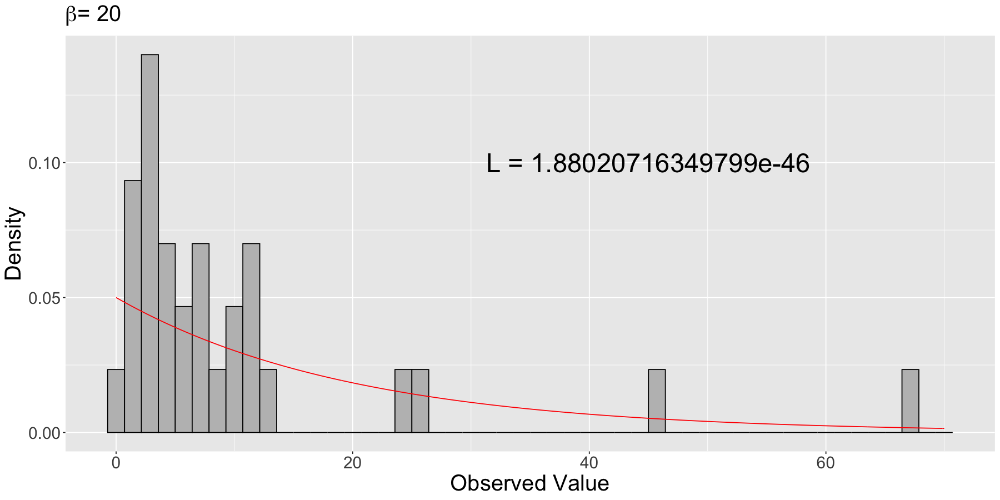

In [22]:
plot_beta_20 <- hist_sample_n30 +
  geom_line(
    data = density_20,
    aes(x = x, y = density), colour = "red"
  ) +
  annotate("text", x = 45, y = 0.1, label = paste0("L = ", likelihood_20), size = 10) +
  ggtitle(expression(paste(beta, "= 20")))

plot_beta_20

Now for $\beta$ values of $8$ and $2$:

In [23]:
likelihood_8 <- prod(dexp(sample_n30$values, rate = 1 / 8))
likelihood_8

[1] 1.479327e-44

In [24]:
density_8 <- tibble(
  x = seq(0, 70, 0.05),
  density = dexp(x, rate = 1 / 8)
)
density_8

x,density
<dbl>,<dbl>
0.00,0.1250000
0.05,0.1242212
0.10,0.1234472
0.15,0.1226781
0.20,0.1219137
0.25,0.1211542
0.30,0.1203993
0.35,0.1196492
0.40,0.1189037


In [25]:
likelihood_2 <- prod(dexp(sample_n30$values, rate = 1 / 2))
likelihood_2

[1] 1.047504e-76

In [26]:
density_2 <- tibble(
  x = seq(0, 70, 0.5),
  density = dexp(x, rate = 1 / 2)
)
density_2

x,density
<dbl>,<dbl>
0.0,0.50000000
0.5,0.38940039
1.0,0.30326533
1.5,0.23618328
2.0,0.18393972
2.5,0.14325240
3.0,0.11156508
3.5,0.08688697
4.0,0.06766764


In [27]:
plot_beta_8 <- hist_sample_n30 +
  geom_line(
    data = density_8,
    aes(x = x, y = density), colour = "red"
  ) +
  annotate("text", x = 45, y = 0.1, label = paste0("L = ", likelihood_8), size = 10) +
  ggtitle(expression(paste(beta, "= 8"))) + ylim(c(0, 0.5))

plot_beta_2 <- hist_sample_n30 +
  geom_line(
    data = density_2,
    aes(x = x, y = density), colour = "red"
  ) +
  annotate("text", x = 45, y = 0.1, label = paste0("L = ", likelihood_2), size = 10) +
  ggtitle(expression(paste(beta, "= 2")))

Then, we plot these theoretical densities on top of the same **the empirical (sample) distribution** (i.e., the **histogram**).

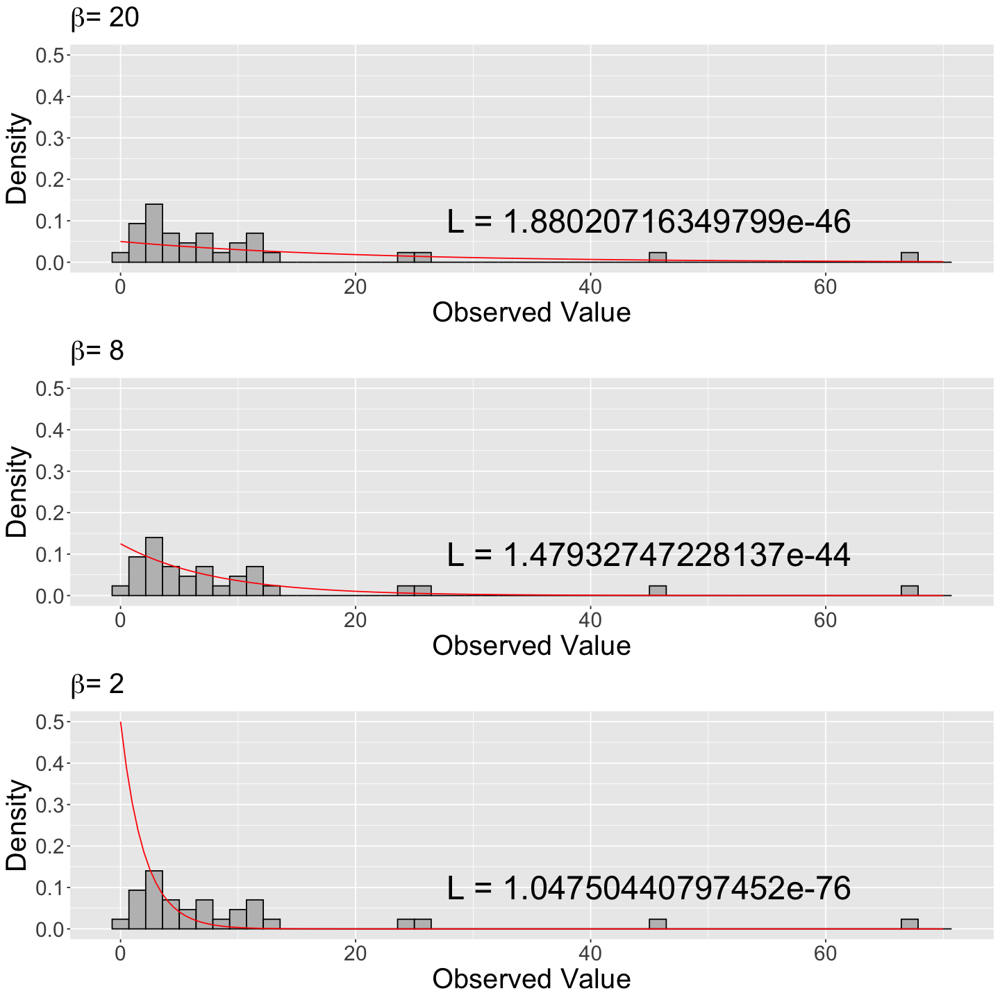

In [28]:
options(repr.plot.width = 12, repr.plot.height = 12)
grid.arrange(plot_beta_20 + ylim(c(0, 0.5)), plot_beta_8, plot_beta_2, nrow = 3)

We can see that the LARGEST likelihood value maps onto the Exponential distribution that best fits the observed data: the one with $\beta = 8$ minutes (note the $y$-axis scale is the same for the three histograms).  

### 4.5. Interlude: The wonders of log-likelihood

Let us re-check the three previous likelihood values coming from `sample_n30`:

- For $\beta = 20$:

In [29]:
likelihood_20 # beta = 20

[1] 1.880207e-46

- For $\beta = 8$:

In [30]:
likelihood_8 # beta = 8

[1] 1.479327e-44

- For $\beta = 2$:

In [31]:
likelihood_2 # beta = 2

[1] 1.047504e-76

Likelihood values are super small! Hence, we could make a logarithmic transformation (i.e., a monotonic transformation) on the base $e$ for the likelihood function: **the log-likelihood function**.

In [32]:
round(log(likelihood_20), 4)

[1] -105.2875

In [33]:
round(log(likelihood_8), 4)

[1] -100.9222

In [34]:
round(log(likelihood_2), 4)

[1] -174.9501

The use of the log-likelihood function is common in MLE **for mathematical and numerical optimization purposes**. 

As previously stated, we would not know the real value for $\beta$. The empirical use above, to estimate the value for $\beta$, shows us that $\beta = 8$ provides the *maximum* value (i.e., **the least negative value**) for the log-likelihood function **from these three possible options**. **This $\beta = 8$ is the value under which our random sample is more likely (under the assumption of an Exponential distribution).**

However, to find the maximum likelihood value (and hence best $\beta$ to obtain our specific Exponential distribution) using this approach would take forever and/or be impossible.

Let us instead calculate and visualize the likelihoods for a wide range of $\beta$'s and choose the specific distribution with the maximum likelihood.

```{important} 
Even though we will automatically try a wide range of $\beta$ values to obtain the one that yields the maximum likelihood, **this is an empirical solution, not an analytical solution**.
```

### 4.6. Finding the maximum likelihood and log-likelihood using a range of $\beta$ values

Let us calculate the likelihood and log-likelihood values for a range of $\beta$ for our `hist_sample_n30` and then plot these.

**What range?** We will try a sequence $5$ to $50$ by $0.5$.

Note the following in the data frame `exp_values`:

- Each row in `possible_betas` indicates a candidate value for $\beta$ to try in our search for the maximum.
- Column `likelihood` indicates the value of the equation {eq}`exponential-likelihood` with the $n = 30$ **observed wait times** stored in `sample_n30$values`.
- Column `log_likelihood` indicates the logarithmic transformation on the base $e$ of column `likelihood`.

In [35]:
exp_values <- tibble(
  possible_betas = seq(5, 50, 0.5),
  likelihood = map_dbl(1 / possible_betas, ~ prod(dexp(sample_n30$values, .))),
  log_likelihood = map_dbl(1 / possible_betas, ~ log(prod(dexp(sample_n30$values, .))))
)
exp_values

possible_betas,likelihood,log_likelihood
<dbl>,<dbl>,<dbl>
5.0,1.783701e-48,-109.94539
5.5,2.780025e-47,-107.19904
6.0,2.183473e-46,-105.13800
6.5,1.030206e-45,-103.58657
7.0,3.302091e-45,-102.42177
7.5,7.854351e-45,-101.55526
8.0,1.479327e-44,-100.92216
8.5,2.316005e-44,-100.47390
9.0,3.127386e-44,-100.17355


Then, we plot the possible $\beta$'s against the likelihood of observing them given our data:

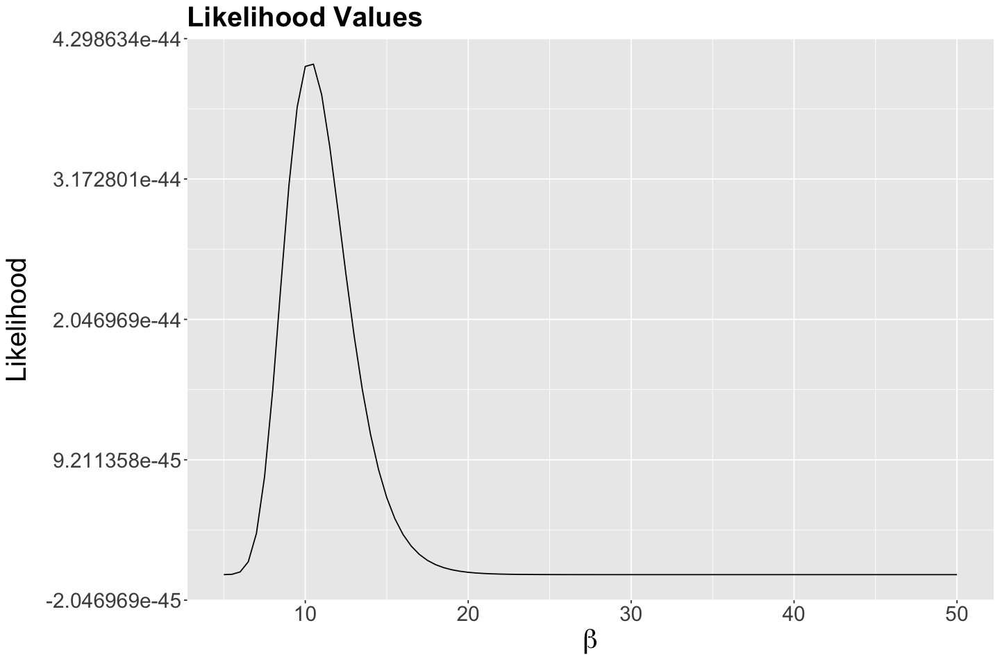

In [36]:
options(repr.plot.height = 8, repr.plot.width = 12)

(exp_like_plot <- ggplot(exp_values, aes(x = possible_betas, y = likelihood)) +
  geom_line() +
  theme(
    plot.title = element_text(size = 24, face = "bold"),
    axis.text = element_text(size = 18),
    axis.title = element_text(size = 24)
  ) +
  ggtitle("Likelihood Values") +
  labs(x = expression(beta), y = "Likelihood"))

**How about the log-likelihood values?**

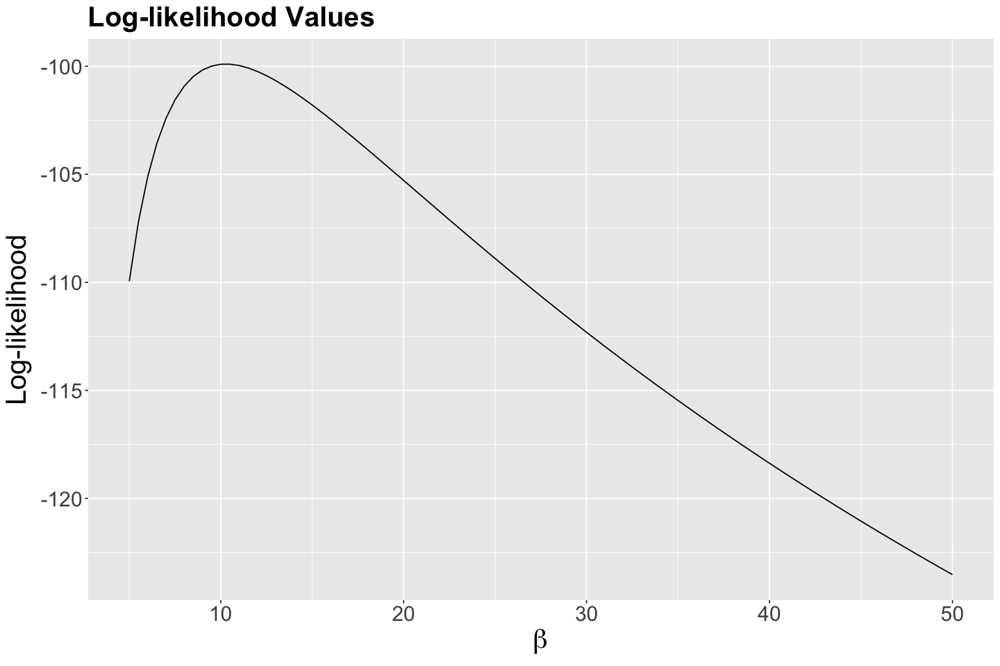

In [37]:
(exp_log_like_plot <- ggplot(exp_values, aes(x = possible_betas, y = log_likelihood)) +
  geom_line() +
  theme(
    plot.title = element_text(size = 24, face = "bold"),
    axis.text = element_text(size = 18),
    axis.title = element_text(size = 24)
  ) +
  ggtitle("Log-likelihood Values") +
  labs(x = expression(beta), y = "Log-likelihood"))

**What is the maximum?** Reading off the graph is a bit difficult, so we will grab the maximum from data frame `empirical_MLE`:

In [38]:
empirical_MLE <- exp_values %>%
  arrange(desc(likelihood)) %>%
  slice(1)
empirical_MLE

possible_betas,likelihood,log_likelihood
<dbl>,<dbl>,<dbl>
10.5,4.093937e-44,-99.90424


According to the previous output, our **empirical maximum likelihood estimate of the mean population wait time between customers is 10.5 minutes**. Let us double-check this matter by plotting it as a vertical blue line on our previous two plots:

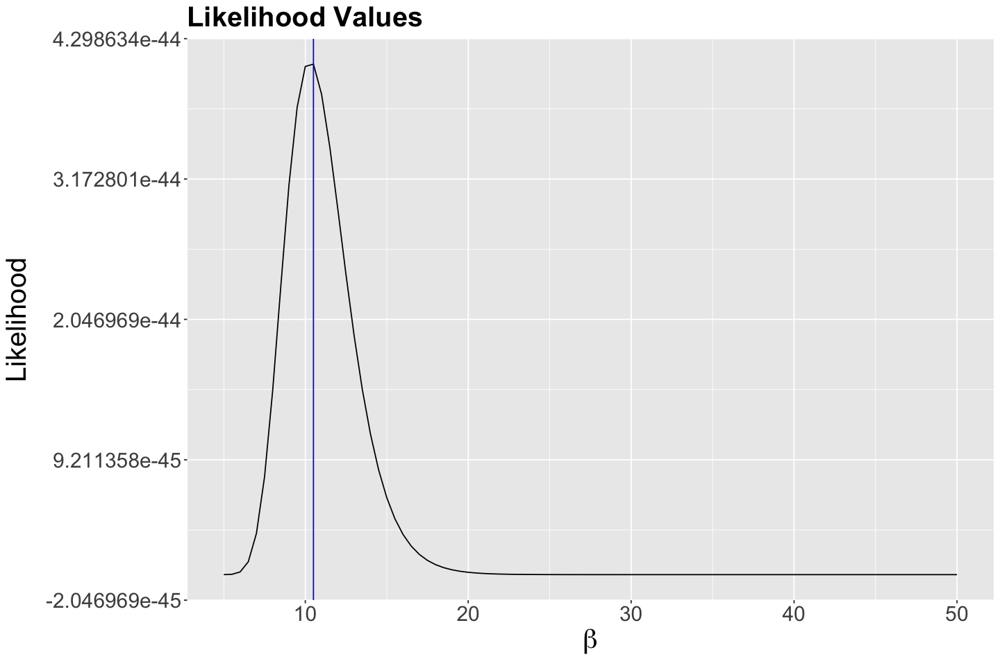

In [39]:
(exp_like_plot <- exp_like_plot +
  geom_vline(xintercept = 10.5, colour = "blue"))

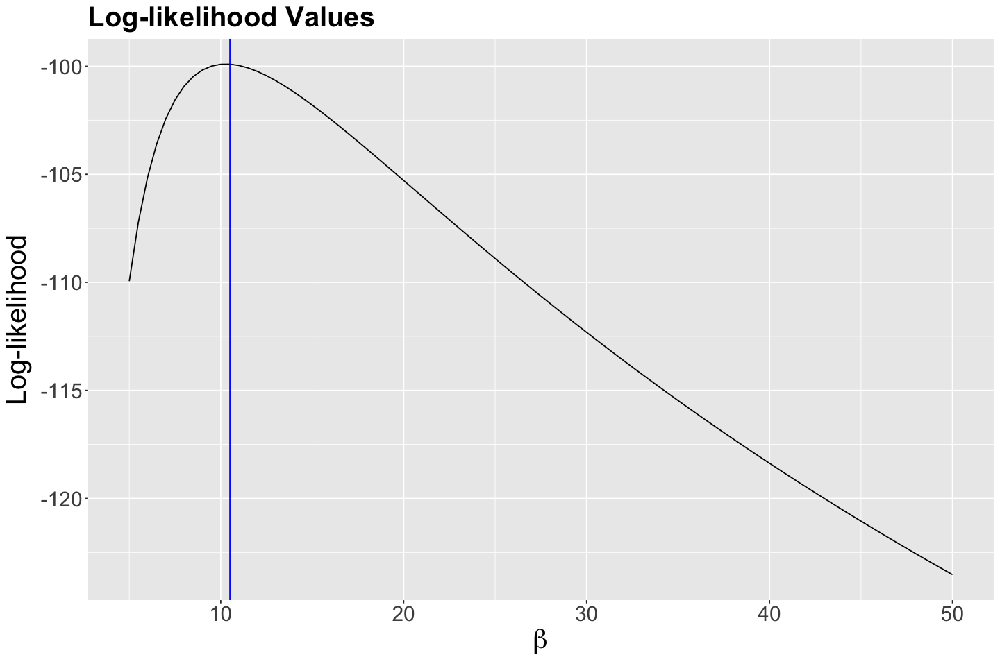

In [40]:
(exp_log_like_plot <- exp_log_like_plot +
  geom_vline(xintercept = 10.5, colour = "blue"))

**Indeed, we have empirically found a maximum at 10.5 minutes!**

```{important}
Let us recall our population parameter to estimate: **the mean wait time in minutes** between each ice cream customer during a given Summer day. Moreover, our population is all our potential ice cream customers during any given Summer day in the following Canadian cities: *Vancouver*, *Victoria*, *Edmonton*, *Calgary*, *Winnipeg*, *Ottawa*, *Toronto*, and *Montréal*.

That said, our pilot study with $n = 30$ sampled wait times indicates that, on average, the **estimated wait time** between each ice cream customer is **10.5 minutes** during a given Summer day via **empirical MLE** overall in these eight cities. The precision of the maximum likelihood estimate we can develop, **using this empirical method**, depends on the increments we vary $\beta$.

Note that this is a primary approach in which we only estimate a single parameter, making this a **univariate MLE** case. We can expand our estimations to more than one overall mean wait time via alternative modelling approaches. For instance, we can also work around a more complex regression model to estimate different mean wait times per city. Nonetheless, this is part of **DSCI 562**.
```

## 5. Can we apply MLE analytically?

**Yes, we can!**

And it will involve multivariate Calculus since we have an optimization problem.

For the Exponential distribution, it can be shown that

$$\hat{\beta} = {\bar{Y}} = \sum_{i = 1}^n \frac{Y_i}{n},$$

which is the sample mean from {eq}`sample-mean-mle`!

**Let us do it with $\beta$ in the Exponential distribution!**

1. We will generalize our derivation by assuming a random sample of $n$ observations (they are *iid*). Recall that the $i$th observation ($i = 1, \dots, n$) has the following PDF:

$$
f_{Y_i}(y_i \mid \beta) = \frac{1}{\beta} \exp(-y_i / \beta)
$$

2. Since the $n$ observations are assumed *iid*, the joint PDF is as folllows:

$$
f_{Y_1, \dots, Y_n}(y_1, \dots, y_n \mid \beta) = \prod_{i = 1}^n \frac{1}{\beta} \exp(-y_i / \beta).
$$

3. The joint likelihood function is mathematically equivalent to the joint PDF. Thus, along with some algebraic rearrangements, we have:

$$
L(\beta \mid y_1, \dots , y_{n}) = \prod_{i = 1}^n \frac{1}{\beta} \exp(-y_i / \beta) = \frac{1}{\beta^n} \exp \bigg( -\frac{1}{\beta} \sum_{i = 1}^n y_i \bigg).
$$

4. Now, we apply some logarithmic properties to obtain the log-likelihood function:

$$
\log L(\beta \mid y_1, \dots , y_{n}) = -n \log (\beta) - \frac{1}{\beta} \sum_{i = 1}^n y_i.
$$

5. We take the first partial derivative, with respect to $\beta$, of the joint log-likelihood function:

```{math}
:label: joint-log-likelihood-first-deriv
\begin{align*}
\frac{\partial}{\partial \beta} \log L(\beta \mid y_1, \dots , y_{n}) &= -\frac{n}{\beta} + \frac{1}{\beta^2} \sum_{i = 1}^n y_i \\
&= \frac{1}{\beta} \left(-n  + \frac{1}{\beta} \sum_{i = 1}^n y_i \right).
\end{align*}
```

6. Then, we set this derivative equal to zero and solve for $\beta$:

$$\frac{1}{\beta} \left(-n  + \frac{1}{\beta} \sum_{i = 1}^n y_i \right) = 0$$
$$-n  + \frac{1}{\beta} \sum_{i = 1}^n y_i = 0$$
$$\frac{1}{\beta} \sum_{i = 1}^n y_i  = n$$

```{math}
:label: mle-exponential
\hat{\beta} = \frac{\sum_{i = 1}^n Y_i}{n} = \bar{Y}
```

```{important}
Since we are obtaining the maximum likelihood **estimator**, the notation in $\hat{\beta}$ on the right-hand side changes to uppercases (random variables).

Furthermore, these six steps also apply to other distributional parameters. For instance, $\mu$ and $\sigma^2$ in the Normal distribution or $\lambda$ in the Poisson distribution.
```

````{admonition} Note
:class: warning
Aside from the previous six steps, there is another step in which we check whether the maximum likelihood estimate is a local maximum. This is called the **second derivative test**. The second derivative is obtained from {eq}`joint-log-likelihood-first-deriv`:

```{math}
:label: joint-log-likelihood-second-deriv
\frac{\partial^2}{\partial \beta^2} \log L(\beta \mid y_1, \dots , y_{n}) = \frac{n}{\beta^2} - \frac{2}{\beta^3} \sum_{i = 1}^n y_i
```

Then, we plug in the **maximum likelihood estimator** {eq}`mle-exponential` as an **estimate** (i.e., observed values denoted by lowercase $y_i$) in {eq}`joint-log-likelihood-second-deriv`:

```{math}
\begin{align*}
\frac{\partial^2}{\partial \beta^2} \log L(\beta \mid y_1, \dots , y_{n}) &= \frac{n}{\left( \frac{\sum_{i = 1}^n y_i}{n} \right)^2} - \frac{2}{\left( \frac{\sum_{i = 1}^n y_i}{n} \right)^3} \sum_{i = 1}^n y_i \\
&= \frac{n^3}{\left(\sum_{i = 1}^n y_i\right)^2} - \frac{2 n^3}{\left( \sum_{i = 1}^n y_i \right)^2} \\
&= -\frac{n^3}{\left(\sum_{i = 1}^n y_i\right)^2} < 0 
\end{align*}
```

According to the **second derivative test**, if our second derivative is less than zero evaluated at our estimate, then **our maximum likelihood estimate is indeed a local maximum**.
````

**Finally...**

Let us convince ourselves of this by overlaying our analytical $\hat{\beta}$ using our observed `sample_n30` on our plots (the vertical red line indicates this **analytical maximum likelihood estimate** $\hat{\beta}$):

In [41]:
analytical_MLE <- mean(sample_n30$values) # We use the sample mean() function from R!
round(analytical_MLE, 2)

[1] 10.28

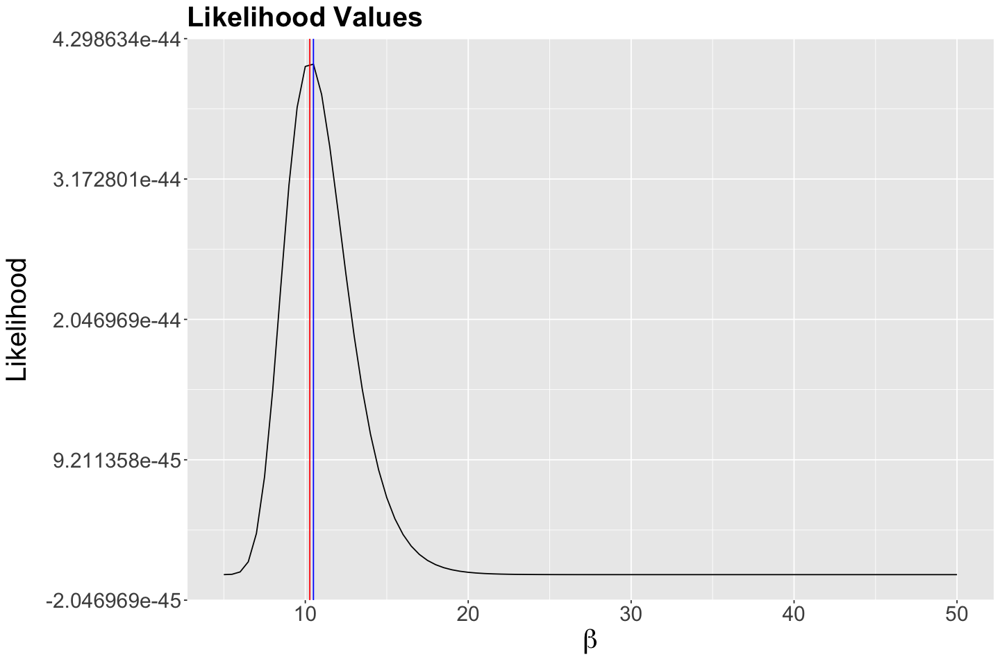

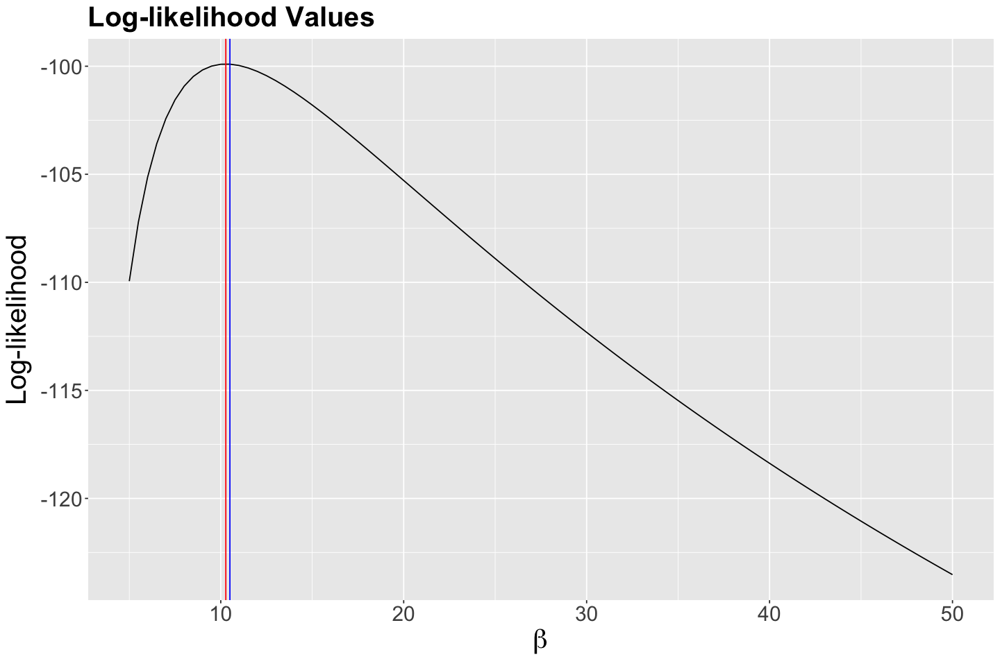

In [42]:
exp_like_plot +
  geom_vline(xintercept = analytical_MLE, colour = "red")

exp_log_like_plot +
  geom_vline(xintercept = analytical_MLE, colour = "red")

## 6. Wrapping up! 

MLE allows us **to estimate population parameters** via the **observed values** of a **random sample**. This is a classical theory-based method where one needs to make strong distributional assumptions on the data (i.e., the distributions we have seen this block). Moreover, the respective estimators are usually well-behaved (asymptotically speaking, which means when the sample size $n \rightarrow \infty$).

**Understanding the foundations of MLE is crucial**, especially in fields like **regression or survival analysis**, where it finds practical applications in GLMs or parametric survival regression.

If we want to estimate our population parameters of interest assuming a distribution that has more than one parameter (e.g., $F$-distribution or regression models with multiple parameters), things get a bit more complicated:

- Mathematically, solving this matter involves complex partial derivatives **without a closed solution**.
- **Numerical optimization** in `R` is possible using the `optim()` function.
- Moreover, we can find different `R` packages that provide **ready-to-use estimation functions** such as `glm()` for GLMs.

It is important to note that we have covered two distinct paths in MLE: the empirical and analytical. A conceptual understanding of both is essential for a thorough grasp of MLE.

### 6.1. Steps for Empirical MLE

**Step 1: Choose the right distribution for the $i$th ($i = 1 , \dots, n$) PDF or probability mass function (PMF)**

- Using information you know about your sample of size $n$, choose a family of distributions.
- Identify the corresponding PDF (**for continuous data**) or PMF (**for discrete data**).

**Step 2: Obtain the joint or PDF or PMF**

Once we have the $i$th PDF or PMF, build the joint probability distribution of the sample of $n$ random variables.

**Step 3: Obtain the joint likelihood function**

Recall this function is mathematically equivalent to the joint PDF or PMF.

**Step 4:  Obtain the joint log-likelihood function**

Use the rules of logarithms on the joint likelihood function.

**Step 5: Vary the parameters for that family of distribution and calculate the likelihood or log-likelihood**

- Use information about the **observed sample** to help choose the range of values to vary the parameter over.
- Given your **observed sample** and the **likelihood** or **log-likelihood** functions, vary the parameter's value all over that range and compute their corresponding function values.

**Step 6: Choose the parameter value that gives you the maximum likelihood or log-likelihood**

This value will be the **maximum likelihood estimate** under which your observed data is most likely.

### 6.2. Steps for Analytical MLE

**Steps 1, 2, 3, and 4 are the same from above.**

**Step 5: Obtain the partial derivative with respect to the parameter of interest**

You have to use the log-likelihood function since its form makes derivation easier.

**Step 6: Set the partial derivative equal to zero and solve for the parameter of interest**

We are doing this because it is an optimization problem.

```{important}
In cases of no analytical solution in this step, we need a numerical optimization method.
```

**Step 7: Check you have a maximum**

You can do it using the second partial derivative criterion with respect to the same parameter of interest.

## 7. (Optional) Supplementary Material

### The use of the `optimize()` function

Let us use `R`'s `optimize()`, to obtain $\hat{\beta}$ with `sample_n30`. This function uses numerical optimization and finds the point where the slope is `0` (maximum). 

`optimize()` needs at least these 3 things:
- The log-likelihood function (that references your data)
- A range of values to vary the parameter over (here `5` to `50`).
- Whether to return the minimum or the maximum of the function.

In [43]:
LL <- function(l) log(prod(dexp(sample_n30$values, rate = 1 / l)))
optimize(LL, c(5, 50), maximum = TRUE)

$maximum
[1] 10.27704

$objective
[1] -99.89738

Note the **optimized maximum** coming from `optimize()` matches the **analytical maximum likelihood estimate**.

## 8. Questions you might have...

1. In previous statistical courses, when we estimated things like mean, standard deviation, or proportion of successes, we only calculated these values from the sample using a simple formula. So why are we using more complicated math now to arrive at essentially the same thing?

> MLE provides you with a great way to **FIND** estimators, which are usually well-behaved (asymptotically speaking!). Finding good estimators is a difficult task. The sample mean is a trivial case with a very intuitive answer. However, sometimes you are trying to estimate something much more complex . For example $\beta_0$ and $\beta_1$ from a linear regression model: $Y = \beta_0 + \beta_1 X_1 + \varepsilon$. How would you estimate these parameters when $\varepsilon \sim \mathcal{N}(0, \sigma^2)$? MLE can help with that! It is an alternative to ordinary least-squares estimation (to be seen in **DSCI 561**). In more complex regression frameworks, such as GLMs, MLE is the go-to parameter estimation method.

2. OK, we are using a different estimation technique - what about that plausible range for an estimate? For example, if I use MLE to estimate a mean and a standard deviation, how do I calculate a plausible range (i.e., confidence intervals for this estimate to be covered in **DSCI 552**)?

> We can come up with the sampling distribution like we do for any given estimator: through asymptotics or bootstraping.

3. When we talked about estimation in general, we said you could estimate any "thing/object." Primarily, we have been working with point estimates, but it could be a function (e.g., empirical distribution function or empirical cumulative distribution function) or other things (a classifier, for example). Are we "limited" to estimating distributions and/or distributional parameters of probability distributions when using MLE?

> The MLE is "limited" to estimating *parameters*, specifically. But we can then use those estimates to compute other things (and one can prove that those computations are also the MLE, if we were to re-parameterize in terms of that quantity). Same with a classifier - first get the MLE of a parameter (like in logistic regression), then do classification. You will see this in the upcoming Machine Learning courses.